## Validate Truth Variabilite+Transient Catalog for DC2 Run 2
### Michael Wood-Vasey
### 2019-09-16

Purpose:
Validate the Truth Catalog for Variables and Transients in DC2 Run 2.


#### 2019-09-16

Scott Daniel has prepared a test catalog for the galaxies.

```
/global/projecta/projectdirs/lsst/groups/SSim/DC2/cosmoDC2_v1.1.4/truth/galaxy_truth_9946.h5
```

In [1]:
test_tract_file='/global/projecta/projectdirs/lsst/groups/SSim/DC2/cosmoDC2_v1.1.4/truth/galaxy_truth_9946.h5'

In [2]:
import numpy as np

import h5py
import pandas as pd

In [3]:
import dask.dataframe as dd
import dask.array as da
import datashader as ds
from holoviews.operation.datashader import datashade, shade, dynspread, rasterize

<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W
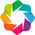

In [4]:
import holoviews as hv
from holoviews import opts
hv.extension('bokeh')

In [5]:
%matplotlib inline

import matplotlib.pyplot as plt

In [6]:
f = h5py.File(test_tract_file)

In [7]:
f.keys()

<KeysViewHDF5 ['flux_g', 'flux_g_noMW', 'flux_i', 'flux_i_noMW', 'flux_r', 'flux_r_noMW', 'flux_u', 'flux_u_noMW', 'flux_y', 'flux_y_noMW', 'flux_z', 'flux_z_noMW', 'galaxy_id', 'redshift']>

In [8]:
f['flux_g']

<HDF5 dataset "flux_g": shape (17361372,), type "<f8">

In [9]:
cols = f.keys()
df = pd.DataFrame({k: f[k] for k in cols})

In [10]:
f.close()

In [11]:
def convert_nanoJansky_to_mag(flux):
    """Convert calibrated nanoJansky flux to AB mag.
    """
    #pylint: disable=C0103
    AB_mag_zp_wrt_Jansky = 8.90  # Definition of AB
    # 9 is from nano=10**(-9)
    #pylint: disable=C0103
    AB_mag_zp_wrt_nanoJansky = 2.5 * 9 + AB_mag_zp_wrt_Jansky

    return -2.5 * np.log10(flux) + AB_mag_zp_wrt_nanoJansky

In [12]:
bands = ['u', 'g', 'r', 'i', 'z', 'y']

for band in bands:
    df[f'mag_{band}'] = convert_nanoJansky_to_mag(df[f'flux_{band}'])
    df[f'mag_{band}_noMW'] = convert_nanoJansky_to_mag(df[f'flux_{band}_noMW'])

(array([   5899.,   66716.,  478559., 1511447., 2548821., 3707609.,
        4283135., 3462024., 1211344.,   85818.]),
 array([0.90823291, 0.91419735, 0.92016179, 0.92612623, 0.93209067,
        0.93805511, 0.94401955, 0.94998399, 0.95594843, 0.96191287,
        0.96787731]),
 <a list of 10 Patch objects>)

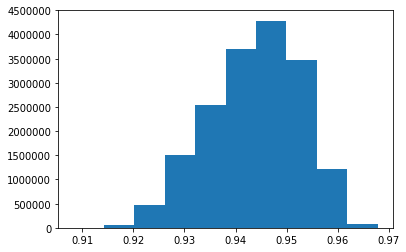

In [13]:
plt.hist(df['flux_g']/df['flux_g_noMW'])

In [14]:
import seaborn as sns

In [15]:
df['u-g'] = df['mag_u'] - df['mag_g']
df['g-r'] = df['mag_g'] - df['mag_r']
df['r-i'] = df['mag_r'] - df['mag_i']
df['z-y'] = df['mag_z'] - df['mag_y']
df['u-g_noMW'] = df['mag_u_noMW'] - df['mag_g_noMW']
df['g-r_noMW'] = df['mag_g_noMW'] - df['mag_r_noMW']
df['r-i_noMW'] = df['mag_r_noMW'] - df['mag_i_noMW']
df['z-y_noMW'] = df['mag_z_noMW'] - df['mag_y_noMW']

In [16]:
points_color_mag_ug = hv.Points(df, kdims=[hv.Dimension('u-g', soft_range=(-2, 3)),
                                           hv.Dimension('mag_g', soft_range=(28, 14))])
color_mag_ug = datashade(points_color_mag_ug)

In [17]:
points_color_mag_gr = hv.Points(df, kdims=[hv.Dimension('g-r', soft_range=(-2, 3)),
                                        hv.Dimension('mag_r', soft_range=(28, 14))])
color_mag_gr = datashade(points_color_mag_gr)

In [18]:
points_color_color_gri = hv.Points(df, kdims=[hv.Dimension('g-r', soft_range=(-2, 3)),
                                              hv.Dimension('r-i', soft_range=(-2, 3))])
color_color_gri = datashade(points_color_color_gri)

In [19]:
points_color_color_ugzy = hv.Points(df, kdims=[hv.Dimension('u-g', soft_range=(-2, 3)),
                                               hv.Dimension('z-y', soft_range=(-2, 3))])
color_color_ugzy = datashade(points_color_color_ugzy)

In [20]:
layout = hv.Layout(color_mag_ug + color_mag_gr + color_color_gri + color_color_ugzy).cols(2)
layout

:Layout
   .DynamicMap.I   :DynamicMap   []
      :RGB   [u-g,mag_g]   (R,G,B,A)
   .DynamicMap.II  :DynamicMap   []
      :RGB   [g-r,mag_r]   (R,G,B,A)
   .DynamicMap.III :DynamicMap   []
      :RGB   [g-r,r-i]   (R,G,B,A)
   .DynamicMap.IV  :DynamicMap   []
      :RGB   [u-g,z-y]   (R,G,B,A)

In [21]:
import GCRCatalogs
reader = 'cosmoDC2'
cat = GCRCatalogs.load_catalog(reader)

In [22]:
bands = ['u', 'g', 'r', 'i', 'z', 'y']
columns = []
columns += [f'mag_{f}' for f in bands]
columns += [f'mag_true_{f}_lsst' for f in bands]
columns += [f'mag_true_{f}_lsst_no_host_extinction' for f in bands]
columns += ['redshift', 'galaxy_id']

cosmoDC2_df = pd.DataFrame(cat.get_quantities(columns,
                                              native_filters=['healpix_pixel==9946']))

In [23]:
print(len(cosmoDC2_df))

17361372


In [24]:
cosmoDC2_df['u-g_cosmoDC2'] = cosmoDC2_df['mag_u'] - cosmoDC2_df['mag_g']
cosmoDC2_df['g-r_cosmoDC2'] = cosmoDC2_df['mag_g'] - cosmoDC2_df['mag_r']
cosmoDC2_df['r-i_cosmoDC2'] = cosmoDC2_df['mag_r'] - cosmoDC2_df['mag_i']
cosmoDC2_df['z-y_cosmoDC2'] = cosmoDC2_df['mag_z'] - cosmoDC2_df['mag_y']

In [25]:
points_color_mag_gr = hv.Points(cosmoDC2_df, kdims=[hv.Dimension('g-r_cosmoDC2', soft_range=(-2, 3)),
                                                 hv.Dimension('mag_r', soft_range=(28, 14))])
cosmoDC2_color_mag_gr = datashade(points_color_mag_gr, cmap='red')

In [26]:
points_color_color_gri = hv.Points(cosmoDC2_df, kdims=[hv.Dimension('g-r_cosmoDC2', soft_range=(-2, 3)),
                                                   hv.Dimension('r-i_cosmoDC2', soft_range=(-2, 3))])
cosmoDC2_color_color_gri = datashade(points_color_color_gri, cmap='red')

In [27]:
points_color_mag_ug = hv.Points(cosmoDC2_df, kdims=[hv.Dimension('u-g_cosmoDC2', soft_range=(-2, 3)),
                                                    hv.Dimension('mag_g', soft_range=(28, 14))])
cosmoDC2_color_mag_ug = datashade(points_color_mag_ug, cmap='red')

In [28]:
points_color_color_ugzy = hv.Points(cosmoDC2_df, kdims=[hv.Dimension('u-g_cosmoDC2', soft_range=(-2, 3)),
                                                        hv.Dimension('z-y_cosmoDC2', soft_range=(-2, 3))])
cosmoDC2_color_color_ugzy = datashade(points_color_color_ugzy, cmap='red')

In [29]:
cosmoDC2_layout = hv.Layout(cosmoDC2_color_mag_ug + cosmoDC2_color_mag_gr + cosmoDC2_color_color_gri + cosmoDC2_color_color_ugzy).cols(2)
cosmoDC2_layout

:Layout
   .DynamicMap.I   :DynamicMap   []
      :RGB   [u-g_cosmoDC2,mag_g]   (R,G,B,A)
   .DynamicMap.II  :DynamicMap   []
      :RGB   [g-r_cosmoDC2,mag_r]   (R,G,B,A)
   .DynamicMap.III :DynamicMap   []
      :RGB   [g-r_cosmoDC2,r-i_cosmoDC2]   (R,G,B,A)
   .DynamicMap.IV  :DynamicMap   []
      :RGB   [u-g_cosmoDC2,z-y_cosmoDC2]   (R,G,B,A)

In [30]:
joint_layout = hv.Layout(color_mag_ug * cosmoDC2_color_mag_ug +
                         color_mag_gr * cosmoDC2_color_mag_gr +
                         color_color_gri * cosmoDC2_color_color_gri +
                         color_color_ugzy * cosmoDC2_color_color_ugzy).cols(2)
joint_layout

:Layout
   .DynamicMap.I   :DynamicMap   []
      :Overlay
         .RGB.I  :RGB   [u-g,mag_g]   (R,G,B,A)
         .RGB.II :RGB   [u-g_cosmoDC2,mag_g]   (R,G,B,A)
   .DynamicMap.II  :DynamicMap   []
      :Overlay
         .RGB.I  :RGB   [g-r,mag_r]   (R,G,B,A)
         .RGB.II :RGB   [g-r_cosmoDC2,mag_r]   (R,G,B,A)
   .DynamicMap.III :DynamicMap   []
      :Overlay
         .RGB.I  :RGB   [g-r,r-i]   (R,G,B,A)
         .RGB.II :RGB   [g-r_cosmoDC2,r-i_cosmoDC2]   (R,G,B,A)
   .DynamicMap.IV  :DynamicMap   []
      :Overlay
         .RGB.I  :RGB   [u-g,z-y]   (R,G,B,A)
         .RGB.II :RGB   [u-g_cosmoDC2,z-y_cosmoDC2]   (R,G,B,A)

In [31]:
points_color_mag_gr_noMW = hv.Points(df, kdims=[hv.Dimension('g-r_noMW', soft_range=(-2, 3)),
                                                hv.Dimension('mag_r_noMW', soft_range=(28, 14))])
color_mag_gr_noMW = datashade(points_color_mag_gr_noMW, cmap='green')

In [32]:
color_mag_gr * color_mag_gr_noMW

:DynamicMap   []
   :Overlay
      .RGB.I  :RGB   [g-r,mag_r]   (R,G,B,A)
      .RGB.II :RGB   [g-r_noMW,mag_r_noMW]   (R,G,B,A)

In [33]:
df['g-g_noMW'] = df['mag_g'] - df['mag_g_noMW']
df['r-r_noMW'] = df['mag_r'] - df['mag_r_noMW']

In [34]:
points_extinction_diff_mag_gr = hv.Points(df, kdims=[hv.Dimension('g-g_noMW', soft_range=(0, 0.1)),
                                                     hv.Dimension('r-r_noMW', soft_range=(0, 0.1))])
extinction_diff_mag = datashade(points_extinction_diff_mag_gr)

In [35]:
extinction_diff_mag

:DynamicMap   []
   :RGB   [g-g_noMW,r-r_noMW]   (R,G,B,A)

In [36]:
import re
[c for c in cat.list_all_quantities() if re.search('lsst', c)]

['mag_true_i_lsst_no_host_extinction',
 'mag_true_g_lsst',
 'mag_Y_lsst',
 'mag_u_lsst',
 'mag_u_lsst_no_host_extinction',
 'mag_r_lsst_no_host_extinction',
 'mag_true_u_lsst',
 'Mag_true_g_lsst_z0',
 'mag_true_g_lsst_no_host_extinction',
 'mag_true_r_lsst_no_host_extinction',
 'mag_true_i_lsst',
 'Mag_true_z_lsst_z0_no_host_extinction',
 'mag_g_lsst_no_host_extinction',
 'mag_i_lsst_no_host_extinction',
 'mag_true_r_lsst',
 'Mag_true_i_lsst_z0',
 'Mag_true_Y_lsst_z0',
 'Mag_true_u_lsst_z0',
 'Mag_true_Y_lsst_z0_no_host_extinction',
 'mag_z_lsst',
 'mag_Y_lsst_no_host_extinction',
 'mag_true_y_lsst',
 'mag_g_lsst',
 'mag_r_lsst',
 'mag_true_z_lsst_no_host_extinction',
 'mag_true_Y_lsst_no_host_extinction',
 'mag_y_lsst',
 'mag_z_lsst_no_host_extinction',
 'Mag_true_y_lsst_z0',
 'Mag_true_i_lsst_z0_no_host_extinction',
 'mag_true_Y_lsst',
 'mag_true_u_lsst_no_host_extinction',
 'Mag_true_z_lsst_z0',
 'Mag_true_g_lsst_z0_no_host_extinction',
 'Mag_true_y_lsst_z0_no_host_extinction',
 'ma

## Directly Compare catalogs
We drew from the same healpix so we should be able to match the new catalog and cosmoDC2.

In [37]:
combined_df = df.merge(cosmoDC2_df, how='inner', on='galaxy_id', suffixes=('', '_cosmoDC2'))

In [38]:
cosmoDC2_df

,mag_i,mag_true_g_lsst_no_host_extinction,mag_true_r_lsst_no_host_extinction,mag_true_i_lsst_no_host_extinction,mag_true_g_lsst,mag_r,mag_y,mag_g,mag_true_i_lsst,mag_true_z_lsst,...,mag_true_u_lsst,mag_true_y_lsst_no_host_extinction,mag_true_z_lsst_no_host_extinction,mag_z,mag_true_r_lsst,redshift,u-g_cosmoDC2,g-r_cosmoDC2,r-i_cosmoDC2,z-y_cosmoDC2
0,15.071088,15.769090,15.258624,15.020999,15.864215,15.333253,14.858172,15.864215,15.071088,14.936170,...,17.170570,14.829284,14.904319,14.936170,15.333253,0.017842,1.306355,0.530962,0.262165,0.077997
1,18.069237,18.521248,18.179539,17.993448,18.654781,18.280825,17.895348,18.654781,18.069237,17.965595,...,19.577520,17.841490,17.905912,17.965595,18.280825,0.023101,0.922739,0.373957,0.211588,0.070248
2,16.305912,17.243483,16.570208,16.242867,17.366688,16.663107,15.897191,17.366688,16.305912,16.061781,...,18.806894,15.856082,16.014791,16.061781,16.663107,0.023389,1.440207,0.703581,0.357195,0.164590
3,14.780982,15.651032,14.992129,14.674319,15.838790,15.139293,14.435933,15.838790,14.780982,14.557519,...,17.304691,14.363873,14.478724,14.557519,15.139293,0.021812,1.465901,0.699497,0.358311,0.121586
4,18.305676,18.773773,18.461906,18.299667,18.773973,18.461941,18.214575,18.773973,18.305676,18.261440,...,19.873121,18.207920,18.252008,18.261440,18.461941,0.024130,1.099148,0.312033,0.156265,0.046865
5,16.653360,17.400812,16.884933,16.645836,17.407019,16.893801,16.474321,17.407019,16.653360,16.544001,...,18.668278,16.471714,16.540916,16.544001,16.893801,0.023968,1.261259,0.513218,0.240440,0.069679
6,13.515429,14.231683,13.693851,13.413964,14.437793,13.848208,13.133689,14.437793,13.515429,13.282910,...,15.631011,13.069026,13.211717,13.282910,13.848208,0.023619,1.193218,0.589584,0.332779,0.149221
7,15.503658,15.858459,15.551193,15.373970,16.088360,15.725872,15.292761,16.088360,15.503658,15.373507,...,16.942678,15.202785,15.272892,15.373507,15.725872,0.023270,0.854319,0.362488,0.222214,0.080746
8,15.741545,16.393454,15.936348,15.708206,16.454077,15.980812,15.533062,16.454077,15.741545,15.613888,...,17.653963,15.509687,15.587801,15.613888,15.980812,0.023894,1.199886,0.473265,0.239267,0.080826
9,19.079794,19.557337,19.241093,19.080067,19.557360,19.238132,18.995243,19.557360,19.079794,19.034275,...,20.497896,18.992893,19.030926,19.034275,19.238132,0.018886,0.940536,0.319227,0.158339,0.039032


In [39]:
bands = ['u', 'g', 'r', 'i', 'z', 'y']
for f in bands:
    combined_df[f'{f}-{f}_cosmoDC2'] = combined_df[f'mag_{f}'] - combined_df[f'mag_{f}_cosmoDC2']

(array([   5198.,   21160.,   78721.,  232211.,  604035., 1348979.,
        2600306., 3501801., 2937932., 1970510.]),
 array([-0.1 , -0.08, -0.06, -0.04, -0.02,  0.  ,  0.02,  0.04,  0.06,
         0.08,  0.1 ]),
 <a list of 10 Patch objects>)

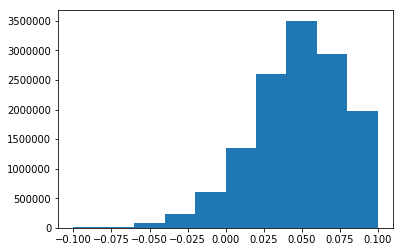

In [40]:
plt.hist(combined_df['g-g_cosmoDC2'], range=(-0.1, +0.1))

In [41]:
bands = ['u', 'g', 'r', 'i', 'z', 'y']
for f in bands:
    print(f, np.nanmedian(combined_df[f'{f}-{f}_cosmoDC2']))

u 0.08176901886482746
g 0.06169418122667203
r 0.045100653519373424
i 0.033914641522450495
z 0.025598940334541354
y 0.02087157708294285


In [42]:
bands = ['u', 'g', 'r', 'i', 'z', 'y']
for f in bands:
    print(f,
          '%7.4f' % np.nanmean(combined_df[f'mag_{f}'] - combined_df[f'mag_{f}_cosmoDC2']),
          '%7.4f' % np.nanmean(combined_df[f'mag_{f}'] - combined_df[f'mag_true_{f}_lsst']),
          '%7.4f' % np.nanmean(combined_df[f'mag_{f}'] - combined_df[f'mag_true_{f}_lsst_no_host_extinction']),
          '%7.4f' % np.nanmean(combined_df[f'mag_{f}_noMW'] - combined_df[f'mag_{f}_cosmoDC2']),
          '%7.4f' % np.nanmean(combined_df[f'mag_{f}_noMW'] - combined_df[f'mag_true_{f}_lsst']),
          '%7.4f' % np.nanmean(combined_df[f'mag_{f}_noMW'] - combined_df[f'mag_true_{f}_lsst_no_host_extinction']),
         )

u  0.0916  0.0826  0.3379  0.0091  0.0001  0.2553
g  0.0719  0.0629  0.2797  0.0090 -0.0001  0.2168
r  0.0557  0.0466  0.2474  0.0090 -0.0001  0.2007
i  0.0446  0.0356  0.2401  0.0090 -0.0001  0.2045
z  0.0363  0.0273  0.2216  0.0090 -0.0001  0.1942
y  0.0317  0.0226  0.1955  0.0090 -0.0001  0.1728


In [45]:
print('mag_noMW - ')
print('%4s %12s %12s %12s' % ('band', 'mag', 'mag_true_lsst', 'mag_true_lsst_no_host_extinction'))
bands = ['u', 'g', 'r', 'i', 'z', 'y']
for f in bands:
    print('%-4s' % f,
          '%12.6f' % np.nanmean(combined_df[f'mag_{f}_noMW'] - combined_df[f'mag_{f}_cosmoDC2']),
          '%12.6f' % np.nanmean(combined_df[f'mag_{f}_noMW'] - combined_df[f'mag_true_{f}_lsst']),
          '%12.4f' % np.nanmean(combined_df[f'mag_{f}_noMW'] - combined_df[f'mag_true_{f}_lsst_no_host_extinction']),
         )

mag_noMW - 
band          mag mag_true_lsst mag_true_lsst_no_host_extinction
u        0.009083     0.000059       0.2553
g        0.008970    -0.000054       0.2168
r        0.008953    -0.000071       0.2007
i        0.008954    -0.000070       0.2045
z        0.008958    -0.000067       0.1942
y        0.008959    -0.000065       0.1728


In [44]:
[c for c in cat.list_all_quantities() if re.search('mag_', c)]

['mag_true_i_lsst_no_host_extinction',
 'mag_true_g_lsst',
 'mag_Y_lsst',
 'mag_true_g',
 'mag_true_i_sdss_no_host_extinction',
 'mag_u_lsst',
 'mag_true_i_sdss',
 'mag_u_lsst_no_host_extinction',
 'mag_true_u_sdss',
 'mag_g',
 'mag_r_lsst_no_host_extinction',
 'mag_u',
 'mag_r_sdss_no_host_extinction',
 'mag_true_u_lsst',
 'mag_true_z_sdss_no_host_extinction',
 'mag_i_sdss',
 'mag_true_g_lsst_no_host_extinction',
 'mag_true_r_lsst_no_host_extinction',
 'mag_true_g_sdss_no_host_extinction',
 'mag_true_r',
 'mag_true_i_lsst',
 'mag_true_r_sdss',
 'mag_g_lsst_no_host_extinction',
 'mag_g_sdss_no_host_extinction',
 'mag_i_lsst_no_host_extinction',
 'mag_true_r_lsst',
 'mag_true_u_sdss_no_host_extinction',
 'mag_i',
 'mag_z',
 'mag_true_z',
 'mag_true_r_sdss_no_host_extinction',
 'mag_z_lsst',
 'mag_Y_lsst_no_host_extinction',
 'mag_y',
 'mag_true_y_lsst',
 'mag_g_lsst',
 'mag_r_lsst',
 'mag_true_z_lsst_no_host_extinction',
 'mag_true_z_sdss',
 'mag_true_Y_lsst_no_host_extinction',
 'mag_y